In [1]:
%load_ext autoreload

In [2]:
%autoreload

import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import xgboost as xgb
import catboost as cb
import lightgbm as lgb

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score,\
                            recall_score, fbeta_score, precision_recall_curve, auc
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from tqdm.notebook import tqdm
from datetime import timedelta, datetime
import numpy as np
import matplotlib.pyplot as plt

from hyperopt import hp
import hyperopt.pyll
from hyperopt.pyll import scope
from hyperopt import STATUS_OK
from hyperopt import fmin, tpe, Trials



import sys
sys.path.append('../../Pipeline')

from ml_utils import plot_confusion_matrix, plot_precision_recall, arg_nearest
from utils import moving_average, reverse_mod


In [3]:
original_df = pd.read_csv('../../../data/cleandata/Info pluviometricas/Merged Data/repaired.csv', sep = ';')
original_df['Data_Hora'] = pd.to_datetime(original_df['Data_Hora'])
original_df['Date'] = original_df['Data_Hora'].dt.date

In [4]:
interest_cols = list({c.split('_')[0] for c in original_df.columns if '_error' in c})
interest_cols.remove('TemperaturaInterna')
interest_cols.remove('SensacaoTermica')

# Group Stations - Mean 

In [5]:
for c in interest_cols:
#     original_df[c] = (original_df[c+'_0'] + original_df[c+'_1'] +
#                       original_df[c+'_2'] + original_df[c+'_3'] + original_df[c+'_4'])/5 
    original_df[c] = original_df[c+'_0']


## Plot data

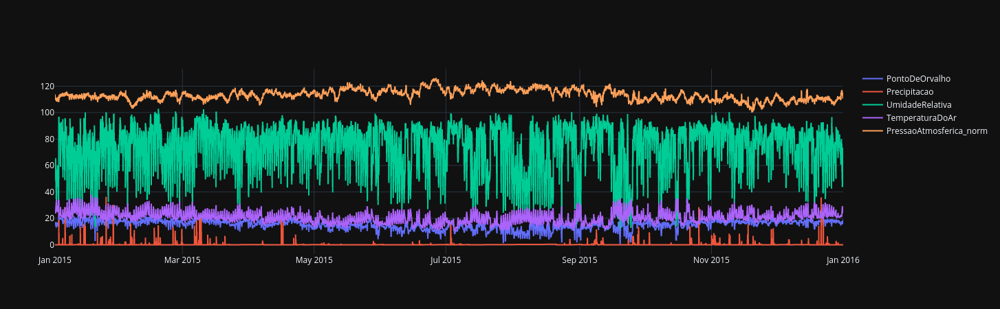

In [6]:
df_plot = original_df[original_df.Data_Hora.dt.year == 2015]

fig = go.Figure(layout=dict(template = 'plotly_dark'))

value = df_plot.loc[:, 'PressaoAtmosferica'].copy() - df_plot.loc[:, 'PressaoAtmosferica'].min() + 100
df_plot.insert(df_plot.shape[1], 'PressaoAtmosferica_norm', value)

for col in ['PontoDeOrvalho', 'Precipitacao', 'UmidadeRelativa', 'TemperaturaDoAr', 'PressaoAtmosferica_norm']:    
    fig.add_trace(go.Scatter(
        x = df_plot['Data_Hora'],
        y = df_plot[col],
        name = col,
                            )
                 )
fig.show()

# Feature Engineering

In [7]:
interest_cols += ['Diff_Temp_POrvalho']
original_df['Diff_Temp_POrvalho'] = original_df['TemperaturaDoAr'] -  original_df['PontoDeOrvalho']

# Create Hour-wise DataFrame 

In [8]:
hours = 6

unique_values = np.arange(0, len(original_df), 1)
n_group = hours * 4

h_id = np.repeat(unique_values, n_group)
original_df['h_id'] = h_id[:len(original_df)]

In [9]:
drop_rows = original_df.groupby('h_id').count().iloc[:,0] < n_group
drop_rows = drop_rows[drop_rows].index.to_list()

In [10]:
drop_rows = original_df.groupby('h_id').count().iloc[:,0] < n_group
drop_rows = drop_rows[drop_rows].index.to_list()

for row in drop_rows:
    original_df = original_df[original_df.h_id != row]
    

In [11]:
map_ = original_df.loc[n_group-1::n_group, ['Data_Hora', 'h_id']].set_index('h_id').to_dict()['Data_Hora']

## Has Rain

In [12]:
precipitacao_sum = original_df.loc[:, ['h_id', 'Precipitacao']].groupby('h_id').sum()

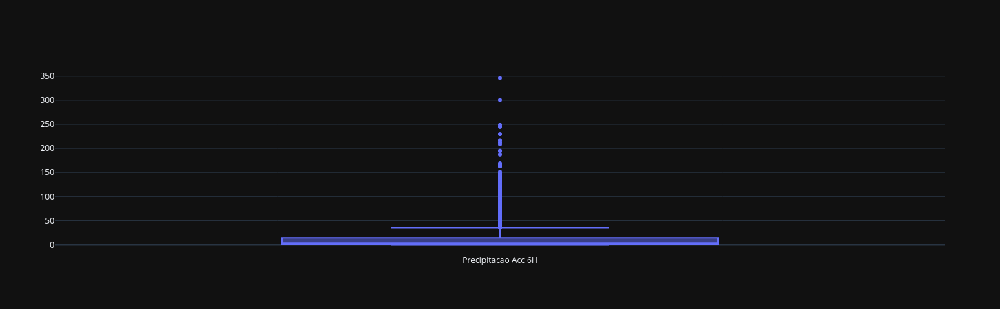

In [13]:
y = precipitacao_sum.loc[precipitacao_sum['Precipitacao'] != 0, 'Precipitacao'].values

fig = go.Figure()

fig.add_trace(go.Box(
    name = f'Precipitacao Acc {hours}H',
    y = y,
                    ))
fig.update_layout(template='plotly_dark')
fig.show()

In [14]:
has_rain_treshold = 0.01
shift = 1

precipitacao_sum.loc[:, 'Rain_Now'] = (precipitacao_sum['Precipitacao'] > has_rain_treshold ).astype(int)
precipitacao_sum.loc[:, f'Rain_Next_{hours}H'] = precipitacao_sum.loc[:, 'Rain_Now'].shift(-shift)
precipitacao_sum = precipitacao_sum.dropna()

# Remove last index (h_id) from original_df
for i in range(shift):
    last_index = original_df.groupby('h_id').count().iloc[:,0].index[-1]
    original_df = original_df[original_df.h_id != last_index]

precipitacao_sum.head(10)


,Precipitacao,Rain_Now,Rain_Next_6H
h_id,,,
0,0.0,0,0.0
1,0.0,0,0.0
2,0.0,0,1.0
3,0.6,1,1.0
4,8.2,1,1.0
5,59.6,1,1.0
6,107.0,1,1.0
7,8.2,1,1.0
8,24.8,1,1.0


In [15]:
df = precipitacao_sum.loc[:, ['Rain_Now', f'Rain_Next_{hours}H']]

## Simple Metrics

In [16]:
interest_cols.remove('DirecaoDoVento')

sum_df = original_df[interest_cols + ['h_id']].groupby('h_id').sum()
sum_df.columns = [c + '_sum' for c in sum_df.columns]
sum_df = sum_df.loc[:,'Precipitacao_sum']


In [17]:
# df = pd.concat([df, mean_df], axis = 1)
df = pd.concat([df, sum_df], axis = 1)
df.index = df.index.map(map_)
df = df.dropna()

In [18]:
df.head()

,Rain_Now,Rain_Next_6H,Precipitacao_sum
h_id,,,
2011-01-01 05:45:00,0,0.0,0.0
2011-01-01 11:45:00,0,0.0,0.0
2011-01-01 17:45:00,0,1.0,0.0
2011-01-01 23:45:00,1,1.0,0.6
2011-01-02 05:45:00,1,1.0,8.2


In [19]:
data_source= original_df[interest_cols]

scaler = MinMaxScaler()
data_source_minmax = scaler.fit_transform(data_source)
data_source_minmax = pd.DataFrame(data_source_minmax, columns = original_df[interest_cols].columns, index = original_df.index )
data_source_minmax = pd.concat([data_source_minmax, original_df['Data_Hora']], axis = 1)

standart = StandardScaler()
data_source_standart = standart.fit_transform(data_source)
data_source_standart = pd.DataFrame(data_source_standart, columns = original_df[interest_cols].columns, index = original_df.index )
data_source_standart = pd.concat([data_source_standart, original_df['Data_Hora']], axis = 1)

data_source_standart

,PressaoAtmosferica,VelocidadeDoVento,UmidadeRelativa,PontoDeOrvalho,RadiacaoSolar,Precipitacao,TemperaturaDoAr,Diff_Temp_POrvalho,Data_Hora
0,-1.011009,-1.260179,0.680062,0.849490,-0.615323,-0.129678,0.050627,-0.585106,2011-01-01 00:00:00
1,-1.090929,-1.186319,0.640929,0.822229,-0.615323,-0.129678,0.028677,-0.585106,2011-01-01 00:15:00
2,-1.117569,-1.001668,0.629748,0.767708,-0.615323,-0.129678,0.028677,-0.544551,2011-01-01 00:30:00
3,-1.197488,-1.278644,0.607386,0.794969,-0.615323,-0.129678,0.050627,-0.544551,2011-01-01 00:45:00
4,-1.197488,-1.204784,0.635338,0.794969,-0.615323,-0.129678,0.028677,-0.564828,2011-01-01 01:00:00
...,...,...,...,...,...,...,...,...,...
306691,-0.824530,2.783662,-0.633683,-0.131897,0.069702,-0.129678,0.138428,0.225986,2019-09-30 16:45:00
306692,-0.797890,3.319147,-0.672816,-0.213679,-0.115997,-0.129678,0.094528,0.246263,2019-09-30 17:00:00
306693,-0.824530,2.248176,-0.566598,-0.240940,-0.499776,-0.129678,-0.037174,0.144877,2019-09-30 17:15:00
306694,-0.771250,2.192781,-0.398886,-0.159157,-0.421370,-0.129678,-0.081075,0.043490,2019-09-30 17:30:00


In [20]:
def make_timeseries(reference_dates, data_source, label_source, select_cols, hours_delta):
        
    n = len(reference_dates) # Number of samples
    m = len(select_cols)     # Number of features
    t = hours_delta * 4      # Length of timeseries
    X = np.empty(shape = [n, t, m], dtype = np.float64)
    hours = np.empty(shape = [n, t], dtype =  np.dtype('<M8[ns]'))
    y = np.empty(shape = [n], dtype = np.int8)
    
    bar = tqdm(total=n)
    
    for i, end_time in enumerate(reference_dates):
        start_time = end_time - timedelta(hours = hours_delta)
        X[i,:,:] = data_source.loc[(data_source['Data_Hora'] >= start_time) & 
                            (data_source['Data_Hora'] < end_time), select_cols].values
        hours[i, : ] = data_source.loc[(data_source['Data_Hora'] > start_time) & 
                            (data_source['Data_Hora'] <= end_time), 'Data_Hora'].values

        y[i] = label_source[label_source.index == end_time].values.item()
        bar.update(1)
        
    return X, y, hours

In [21]:
# LookBack Size
hours_delta = 24

normalization = 'MinMax'

if normalization == 'None':
    X, y, time = make_timeseries(df.iloc[hours_delta*4:].index, original_df, df[f'Rain_Next_{hours}H'], interest_cols, hours_delta)
elif normalization == 'MinMax': 
    X, y, time = make_timeseries(df.iloc[hours_delta*4//n_group:].index, data_source_minmax, df[f'Rain_Next_{hours}H'], interest_cols, hours_delta)
elif normalization == 'Standart':
    X, y, time = make_timeseries(df.iloc[hours_delta*4:].index, data_source_standart, df[f'Rain_Next_{hours}H'], interest_cols, hours_delta)

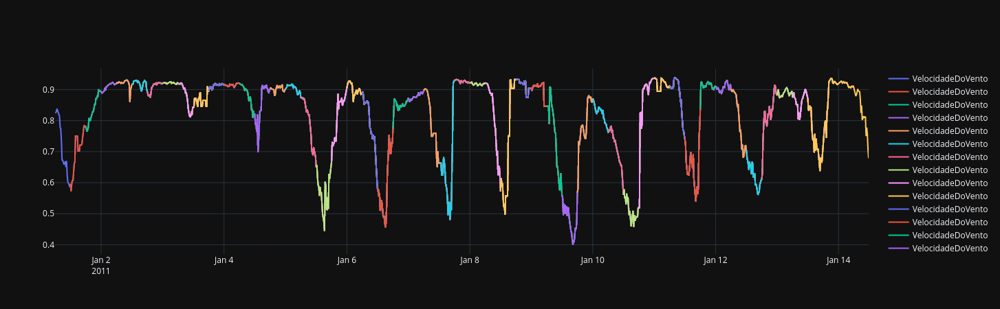

In [22]:
fig = go.Figure()#(3,1, shared_xaxes=True)

selected_col = 'UmidadeRelativa'

index = interest_cols.index(selected_col)
for i in range(50):
    x = pd.to_datetime(pd.DataFrame(time[i,:])[0])
    fig.add_trace(go.Scatter(
        x = x,
        y = X[i, :, index],
        name = interest_cols[1],
    )
                 )
    
fig.update_layout(template='plotly_dark')
fig.show()

In [25]:

import tensorflow
physical_devices = tensorflow.config.list_physical_devices('GPU')
tensorflow.config.experimental.set_memory_growth(physical_devices[0], enable=True)

from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.sequence import pad_sequences

METRICS = [
      tensorflow.keras.metrics.BinaryAccuracy(name='accuracy'),
      tensorflow.keras.metrics.Precision(name='precision'),
      tensorflow.keras.metrics.Recall(name='recall'),
      tensorflow.keras.metrics.AUC(name='auc'),
        ]

def plot_history(history, key):
      # Use a log scale to show the wide range of values.
    plt.plot(history.epoch,  history.history[key],
               color='b', label = 'train')
    plt.plot(history.epoch,  history.history[f'val_{key}'],
               color='orange', label = 'test')
    plt.xlabel('Epoch')
    plt.ylabel(key)
  
    plt.legend()
    
def plot_metrics(history):
    metrics =  ['loss', 'auc', 'precision', 'recall']
    for n, metric in enumerate(metrics):
        name = metric.replace("_"," ").capitalize()
        plt.subplot(2,2,n+1)
        plt.plot(history.epoch,  history.history[metric], color=colors[0], label='Train')
        plt.xlabel('Epoch')
        plt.ylabel(name)
        if metric == 'loss':
            plt.ylim([0, plt.ylim()[1]])
        elif metric == 'auc':
            plt.ylim([0.8,1])
        else:
              plt.ylim([0,1])

    plt.legend()
    
def make_model(shape, metrics = METRICS, output_bias=None):
    if output_bias is not None:
        output_bias = tensorflow.keras.initializers.Constant(output_bias)
        
    adam = Adam(lr=0.001)

    model = Sequential()
    #model.add(LSTM(64, return_sequences=True, input_shape=(shape[1], shape[2])))
    model.add(LSTM(64, return_sequences=False, input_shape=(shape[1], shape[2])))
    #model.add(Dropout(0.3))
    #model.add(LSTM(64))
    model.add(Dense(10))
    model.add(Dropout(0.3))
    #model.add(Dense(units=64, activation='relu'))
    model.add(Dense(units=1, activation='sigmoid'))
    
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=metrics)

    return model
    
EPOCHS = 50
BATCH_SIZE = 200

early_stopping = tensorflow.keras.callbacks.EarlyStopping(
    monitor='loss', 
    verbose=1,
    patience=10,
    mode='max',
    restore_best_weights=True)

In [26]:
model = make_model(shape=X.shape)
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 64)                18688     
_________________________________________________________________
dense (Dense)                (None, 10)                650       
_________________________________________________________________
dropout (Dropout)            (None, 10)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 11        
Total params: 19,349
Trainable params: 19,349
Non-trainable params: 0
_________________________________________________________________


In [27]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
                                    X, y, test_size=0.33, random_state=42)

In [28]:
X_test.shape, X_train.shape, y_test.shape, y_train.shape

((4216, 96, 8), (8559, 96, 8), (4216,), (8559,))

In [29]:
for i in tqdm(range(50)):
    model.fit(
        X_train,
        y_train,
        batch_size=BATCH_SIZE,
        epochs=20,
        callbacks = [early_stopping],
        verbose = 0,
        validation_data=(X_test, y_test),
        # The class weights go here
        #class_weight=class_weight,
        )
    model.reset_states()

UnknownError:  [_Derived_]  Fail to find the dnn implementation.
	 [[{{node CudnnRNN}}]]
	 [[sequential/lstm/StatefulPartitionedCall]] [Op:__inference_train_function_4137]

Function call stack:
train_function -> train_function -> train_function


In [ ]:
# plt.figure(figsize=(12,6))
# plt.subplot(1,2,1)
# plot_history(history, 'loss')
# plt.subplot(1,2,2)
# plot_history(history, 'accuracy')

In [ ]:
y_pred = (model.predict(X_test) > 0.5).astype(int)
y_pred_prob = model.predict(X_test)

In [ ]:
fig = plot_precision_recall(y_test, y_pred_prob)
fig.update_layout(template = 'plotly_dark')
fig.show()

In [ ]:
desired_recall = 0.8

precision, recall, threshold = precision_recall_curve(y_test, y_pred_prob)
y_pred_threshold = (y_pred_prob > threshold[arg_nearest(recall, desired_recall)]).astype(int)

plot_confusion_matrix(y_test, y_pred_threshold, ['0','1'])
evaluate = (y_test, y_pred_threshold)
print('f1_score: ', f1_score(*evaluate))
print('Accuracy: ', accuracy_score(*evaluate))
print('Precision: ', precision_score(*evaluate))
precision, recall, _ = precision_recall_curve(y_test, y_pred)
print('Recall: ', recall_score(*evaluate))
print('AuC: ', auc(recall, precision))